In [1]:
import numpy as np
from keras.models import Sequential
from keras.layers import Activation, LSTM
from sklearn.preprocessing import MinMaxScaler

In [2]:
xy=np.loadtxt("stock.csv", delimiter=",")
xy

array([[8.28659973e+02, 8.33450012e+02, 8.28349976e+02, 1.24770000e+06,
        8.31659973e+02],
       [8.23020020e+02, 8.28070007e+02, 8.21655029e+02, 1.59780000e+06,
        8.28070007e+02],
       [8.19929993e+02, 8.24400024e+02, 8.18979980e+02, 1.28170000e+06,
        8.24159973e+02],
       ...,
       [5.66892592e+02, 5.67002574e+02, 5.56932537e+02, 1.08000000e+04,
        5.56972503e+02],
       [5.61202549e+02, 5.66432590e+02, 5.58672539e+02, 4.12000000e+04,
        5.59992565e+02],
       [5.68002570e+02, 5.68002570e+02, 5.52922516e+02, 1.31000000e+04,
        5.58462551e+02]])

In [3]:
xy=xy[::-1]
xy

array([[5.68002570e+02, 5.68002570e+02, 5.52922516e+02, 1.31000000e+04,
        5.58462551e+02],
       [5.61202549e+02, 5.66432590e+02, 5.58672539e+02, 4.12000000e+04,
        5.59992565e+02],
       [5.66892592e+02, 5.67002574e+02, 5.56932537e+02, 1.08000000e+04,
        5.56972503e+02],
       ...,
       [8.19929993e+02, 8.24400024e+02, 8.18979980e+02, 1.28170000e+06,
        8.24159973e+02],
       [8.23020020e+02, 8.28070007e+02, 8.21655029e+02, 1.59780000e+06,
        8.28070007e+02],
       [8.28659973e+02, 8.33450012e+02, 8.28349976e+02, 1.24770000e+06,
        8.31659973e+02]])

In [4]:
scaler=MinMaxScaler(feature_range=(0,1))
xy=scaler.fit_transform(xy)
xy

array([[2.13751054e-01, 2.08179810e-01, 1.91791832e-01, 4.66075110e-04,
        1.92092403e-01],
       [1.93935034e-01, 2.03641926e-01, 2.08664571e-01, 2.98467330e-03,
        1.96551555e-01],
       [2.10516454e-01, 2.05289413e-01, 2.03558748e-01, 2.59926504e-04,
        1.87749731e-01],
       ...,
       [9.47895671e-01, 9.49273354e-01, 9.72504894e-01, 1.14170476e-01,
        9.66454635e-01],
       [9.56900354e-01, 9.59881107e-01, 9.80354498e-01, 1.42502465e-01,
        9.77850239e-01],
       [9.73335806e-01, 9.75431522e-01, 1.00000000e+00, 1.11123062e-01,
        9.88313021e-01]])

In [5]:
x=xy
y=xy[:,[-1]]
y

array([[0.1920924 ],
       [0.19655155],
       [0.18774973],
       [0.21744815],
       [0.21698189],
       [0.22496747],
       [0.14744274],
       [0.13289962],
       [0.18171679],
       [0.2086465 ],
       [0.14106001],
       [0.11089532],
       [0.11649107],
       [0.12791587],
       [0.18649648],
       [0.12692483],
       [0.10512477],
       [0.12316526],
       [0.10022843],
       [0.09504062],
       [0.06886882],
       [0.07169585],
       [0.10244347],
       [0.09941237],
       [0.11308129],
       [0.10311379],
       [0.102764  ],
       [0.06583772],
       [0.05074084],
       [0.05377184],
       [0.07630073],
       [0.1089136 ],
       [0.11815244],
       [0.0993833 ],
       [0.07994365],
       [0.08183815],
       [0.10582417],
       [0.1084764 ],
       [0.13520206],
       [0.15303849],
       [0.17530499],
       [0.21392171],
       [0.20147697],
       [0.19681376],
       [0.19626009],
       [0.17888975],
       [0.1526887 ],
       [0.151

In [6]:
seq_length=7

In [7]:
datax=[]
datay=[]

In [8]:
for i in range(0, len(y)-seq_length):
    _x=x[i:i+seq_length]
    _y=y[i+seq_length]
    print(x, "->", y)
    datax.append(_x)
    datay.append(_y)

[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.105

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

 [0.98831302]]
[[2.13751054e-01 2.08179810e-01 1.91791832e-01 4.66075110e-04
  1.92092403e-01]
 [1.93935034e-01 2.03641926e-01 2.08664571e-01 2.98467330e-03
  1.96551555e-01]
 [2.10516454e-01 2.05289413e-01 2.03558748e-01 2.59926504e-04
  1.87749731e-01]
 ...
 [9.47895671e-01 9.49273354e-01 9.72504894e-01 1.14170476e-01
  9.66454635e-01]
 [9.56900354e-01 9.59881107e-01 9.80354498e-01 1.42502465e-01
  9.77850239e-01]
 [9.73335806e-01 9.75431522e-01 1.00000000e+00 1.11123062e-01
  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08

  9.88313021e-01]] -> [[0.1920924 ]
 [0.19655155]
 [0.18774973]
 [0.21744815]
 [0.21698189]
 [0.22496747]
 [0.14744274]
 [0.13289962]
 [0.18171679]
 [0.2086465 ]
 [0.14106001]
 [0.11089532]
 [0.11649107]
 [0.12791587]
 [0.18649648]
 [0.12692483]
 [0.10512477]
 [0.12316526]
 [0.10022843]
 [0.09504062]
 [0.06886882]
 [0.07169585]
 [0.10244347]
 [0.09941237]
 [0.11308129]
 [0.10311379]
 [0.102764  ]
 [0.06583772]
 [0.05074084]
 [0.05377184]
 [0.07630073]
 [0.1089136 ]
 [0.11815244]
 [0.0993833 ]
 [0.07994365]
 [0.08183815]
 [0.10582417]
 [0.1084764 ]
 [0.13520206]
 [0.15303849]
 [0.17530499]
 [0.21392171]
 [0.20147697]
 [0.19681376]
 [0.19626009]
 [0.17888975]
 [0.1526887 ]
 [0.15187264]
 [0.17880235]
 [0.18588448]
 [0.2027593 ]
 [0.19818349]
 [0.19319974]
 [0.17137043]
 [0.17256536]
 [0.1507653 ]
 [0.14706388]
 [0.17725764]
 [0.18171679]
 [0.18597188]
 [0.21100727]
 [0.21004549]
 [0.2509354 ]
 [0.24321202]
 [0.24682604]
 [0.24111364]
 [0.26265149]
 [0.26167525]
 [0.26865535]
 [0.26142749

In [9]:
trainSize=int(len(datay)*0.7)
testSize=len(datay)-trainSize

In [10]:
trainx, testx=np.array(datax[0:trainSize]), np.array(datax[trainSize:])

In [12]:
trainy, testy=np.array(datay[0:trainSize]), np.array(datay[trainSize:])

In [13]:
model=Sequential()
model.add(LSTM(1,input_shape=(7,5),return_sequences=False))

In [14]:
model.add(Activation("linear"))

In [15]:
model.compile(loss='mean_squared_error', optimizer='adam')

In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 1)                 28        
_________________________________________________________________
activation (Activation)      (None, 1)                 0         
Total params: 28
Trainable params: 28
Non-trainable params: 0
_________________________________________________________________


In [17]:
model.fit(trainx, trainy, epochs=200)

Epoch 1/200
16/16 [==============================] - 0s 8ms/step - loss: 0.1690
Epoch 2/200
16/16 [==============================] - 0s 7ms/step - loss: 0.1424
Epoch 3/200
16/16 [==============================] - 0s 7ms/step - loss: 0.1188
Epoch 4/200
16/16 [==============================] - 0s 9ms/step - loss: 0.0951
Epoch 5/200
16/16 [==============================] - 0s 7ms/step - loss: 0.0725
Epoch 6/200
16/16 [==============================] - 0s 7ms/step - loss: 0.0519
Epoch 7/200
16/16 [==============================] - 0s 9ms/step - loss: 0.0356
Epoch 8/200
16/16 [==============================] - 0s 8ms/step - loss: 0.0235
Epoch 9/200
16/16 [==============================] - 0s 9ms/step - loss: 0.0159
Epoch 10/200
16/16 [==============================] - 0s 8ms/step - loss: 0.0118
Epoch 11/200
16/16 [==============================] - 0s 8ms/step - loss: 0.0094
Epoch 12/200
16/16 [==============================] - 0s 7ms/step - loss: 0.0083
Epoch 13/200
16/16 [=================

In [18]:
testpredict=model.predict(testx)

In [19]:
import matplotlib.pyplot as plt

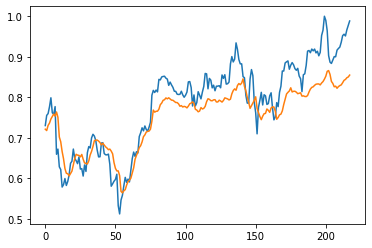

In [21]:
plt.plot(testy)
plt.plot(testpredict)

In [1]:
from keras.models import Sequential
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Activation
from keras.callbacks import EarlyStopping, ModelCheckpoint
import keras
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


In [2]:
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

gray_scale = 255
x_train /= gray_scale
x_test /= gray_scale

In [3]:
model = Sequential([
    Flatten(input_shape=(28, 28)), # 데이터 차원 변경
    Dense(256, activation='relu'), # 첫번째 히든 레이어 (h1)
    Dense(128, activation='relu'), # 두번째 히든 레이어 (h2)
    Dropout(0.1), # 두번째 히든 레이어(h2)에 드랍아웃(10%) 적용
    Dense(10), # 세번째 히든 레이어 (logit)
    Activation('softmax') # softmax layer
])

In [4]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense (Dense)                (None, 256)               200960    
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                1290      
_________________________________________________________________
activation (Activation)      (None, 10)                0         
Total params: 235,146
Trainable params: 235,146
Non-trainable params: 0
__________________________________________________

In [5]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [6]:
callbacks = [EarlyStopping(monitor='val_accuracy', patience=5)]
model.fit(x_train, y_train, epochs=300, batch_size=1000, validation_split = 0.1, callbacks=callbacks)

Epoch 1/300
54/54 [==============================] - 1s 26ms/step - loss: 0.6782 - accuracy: 0.8126 - val_loss: 0.2148 - val_accuracy: 0.9400
Epoch 2/300
54/54 [==============================] - 1s 20ms/step - loss: 0.2432 - accuracy: 0.9296 - val_loss: 0.1475 - val_accuracy: 0.9620
Epoch 3/300
54/54 [==============================] - 1s 25ms/step - loss: 0.1733 - accuracy: 0.9495 - val_loss: 0.1207 - val_accuracy: 0.9678
Epoch 4/300
54/54 [==============================] - 1s 24ms/step - loss: 0.1373 - accuracy: 0.9596 - val_loss: 0.1031 - val_accuracy: 0.9707
Epoch 5/300
54/54 [==============================] - 1s 23ms/step - loss: 0.1121 - accuracy: 0.9667 - val_loss: 0.0893 - val_accuracy: 0.9745
Epoch 6/300
54/54 [==============================] - 1s 23ms/step - loss: 0.0921 - accuracy: 0.9726 - val_loss: 0.0832 - val_accuracy: 0.9757
Epoch 7/300
54/54 [==============================] - 1s 21ms/step - loss: 0.0783 - accuracy: 0.9770 - val_loss: 0.0777 - val_accuracy: 0.9773
Epoch 

In [7]:
results = model.evaluate(x_test,  y_test, verbose = 0)
print('test loss, test acc:', results)

test loss, test acc: [0.06895500421524048, 0.9786999821662903]


In [8]:
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [9]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

In [10]:
import numpy as np
x_train = np.reshape(x_train, (60000,28,28,1)) # 마지막 1: GrayScale, 3: Color(RGB) Scale
x_test = np.reshape(x_test, (10000,28,28,1))

In [11]:
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

gray_scale = 255
x_train /= gray_scale
x_test /= gray_scale
num_classes = 10
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

In [12]:
model = Sequential()
model.add(Conv2D(16, kernel_size=(5, 5),
                 activation='relu',
                 input_shape=(28,28,1),padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))

In [13]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 16)        416       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 32)        12832     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 32)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 1568)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               200832    
_________________________________________________________________
dense_4 (Dense)              (None, 10)               

In [14]:
model.compile(loss=categorical_crossentropy,
              optimizer=Adam(),
              metrics=['accuracy'])

In [15]:
callbacks = [EarlyStopping(monitor='val_accuracy', patience=2)]

In [16]:
model.fit(x_train, y_train,
          batch_size=500,
          epochs=5,
          verbose=1,
          validation_split = 0.1, 
          callbacks=callbacks)

Epoch 1/5
108/108 [==============================] - 37s 346ms/step - loss: 0.4684 - accuracy: 0.8699 - val_loss: 0.1091 - val_accuracy: 0.9708
Epoch 2/5
108/108 [==============================] - 32s 296ms/step - loss: 0.1025 - accuracy: 0.9696 - val_loss: 0.0711 - val_accuracy: 0.9810
Epoch 3/5
108/108 [==============================] - 34s 314ms/step - loss: 0.0673 - accuracy: 0.9798 - val_loss: 0.0584 - val_accuracy: 0.9840
Epoch 4/5
108/108 [==============================] - 32s 300ms/step - loss: 0.0519 - accuracy: 0.9840 - val_loss: 0.0541 - val_accuracy: 0.9850
Epoch 5/5
108/108 [==============================] - 32s 299ms/step - loss: 0.0432 - accuracy: 0.9869 - val_loss: 0.0475 - val_accuracy: 0.9863


In [17]:
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.0346178263425827
Test accuracy: 0.9891999959945679
